In [0]:
# We leveraged data that was available on cloud (Open source data from Finn Hub), this is data at atomic level. For my use case, we had to process the data and apply some transformations so that I can get the desired insights as below:

# The code aims to extract stock data from Finn Hub API for a list of specified stocks within a specific time period. It then performs some data processing and transformations to create a clean and usable dataset, before saving it to a CSV file in DBFS. Finally, it uses PySpark to read the CSV file, filter the data to the relevant time period, and calculate the average opening price for each stock symbol. It then creates a bar chart to visualize the results.

In [0]:
pip install finnhub-python

Python interpreter will be restarted.
Python interpreter will be restarted.


In [0]:
import pandas as pd
import finnhub
import matplotlib.pyplot as plt
import csv
from io import StringIO
import base64
import seaborn as sns

file_path = '/mnt/data/stocks.csv'

# Setup the Finnhub client with the API key
finnhub_client = finnhub.Client(api_key="cgdk2u9r01qpf4i24vtgcgdk2u9r01qpf4i24vu0")

# defining the stock symbols and time period
symbols = ['AAPL', 'GOOG', 'MSFT', 'AMZN', 'FB', 'TSLA', 'NVDA', 'NFLX', 'PYPL', 'ADBE', 'AAL', 'USB', 'INTC', 'WFC', 'BAC', 'HPQ', 'UBER', 'F', 'NVDA', 'T', 'GOOGL', 'LYFT', 'META' ]
start_date = '2000-01-01'
end_date = '2023-05-01'

stock_data = []
for symbol in symbols:
    data = finnhub_client.stock_candles(symbol, 'D', int(pd.Timestamp(start_date).timestamp()), int(pd.Timestamp(end_date).timestamp()))
    df = pd.DataFrame(data)
        
    # Transform the data, as per my use case I am creating the field names
    df['symbol'] = symbol
    df['date'] = pd.to_datetime(df['t'], unit='s').dt.date
    df['opening_price'] = df['o'].astype(float)
    df['highest_price'] = df['h'].astype(float)
    df['lowest_price'] = df['l'].astype(float)
    df['closing_price'] = df['c'].astype(float)
    df['status'] = df['s'].astype(str)
    df['volume'] = df['v'].astype(float)
    df = df[['symbol', 'date', 'opening_price', 'highest_price', 'lowest_price', 'closing_price', 'status', 'volume']]
    stock_data.append(df)
all_stocks_data = pd.concat(stock_data)

# Cleaning the data
all_stocks_data.dropna(inplace=True)
all_stocks_data.drop_duplicates(inplace=True)

# Validating the data
q1 = all_stocks_data['closing_price'].quantile(0.25)
q3 = all_stocks_data['closing_price'].quantile(0.75)
iqr = q3 - q1
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr
all_stocks_data = all_stocks_data[(all_stocks_data['closing_price'] > lower_bound) & (all_stocks_data['closing_price'] < upper_bound)]

print(all_stocks_data)

# Saving the data frame to a CSV file in DBFS
dbutils.fs.put(file_path, all_stocks_data.to_csv(index=False), True)


csv_string = all_stocks_data.to_csv(index=False)
csv_base64 = base64.b64encode(csv_string.encode()).decode()
download_link = f'<a href="data:text/csv;base64,{csv_base64}" download="sample.csv">Download CSV file</a>'
from IPython.display import HTML
HTML(download_link)


     symbol        date  opening_price  highest_price  lowest_price  \
0      AAPL  2000-01-03        0.93638        1.00446       0.90792   
1      AAPL  2000-01-04        0.96652        0.98772       0.90346   
2      AAPL  2000-01-05        0.92634        0.98716       0.91964   
3      AAPL  2000-01-06        0.94754        0.95536       0.84821   
4      AAPL  2000-01-07        0.86161        0.90178       0.85268   
...     ...         ...            ...            ...           ...   
2630   META  2022-10-31       98.22000       99.32000      92.60000   
2631   META  2022-11-01       94.33000       97.49000      93.55000   
2632   META  2022-11-02       94.20500       95.20000      90.48000   
2633   META  2022-11-03       90.08000       90.45760      88.41000   
2634   META  2022-11-04       90.35000       91.39000      88.09000   

      closing_price status       volume  
0           0.99944     ok  535819648.0  
1           0.91518     ok  511728448.0  
2           0.92857  

<a href="data:text/csv;base64,c3ltYm9sLGRhdGUsb3BlbmluZ19wcmljZSxoaWdoZXN0X3ByaWNlLGxvd2VzdF9wcmljZSxjbG9zaW5nX3ByaWNlLHN0YXR1cyx2b2x1bWUKQUFQTCwyMDAwLTAxLTAzLDAuOTM2MzgwMzU3MTQyODU3MiwxLjAwNDQ1OTgyMTQyODU3MTQsMC45MDc5MTk2NDI4NTcxNDI5LDAuOTk5NDQwMTc4NTcxNDI4NSxvayw1MzU4MTk2NDguMApBQVBMLDIwMDAtMDEtMDQsMC45NjY1MTk2NDI4NTcxNDI5LDAuOTg3NzE5NjQyODU3MTQyOSwwLjkwMzQ1OTgyMTQyODU3MTQsMC45MTUxODAzNTcxNDI4NTcyLG9rLDUxMTcyODQ0OC4wCkFBUEwsMjAwMC0wMS0wNSwwLjkyNjM0MDE3ODU3MTQyODYsMC45ODcxNTk4MjE0Mjg1NzE0LDAuOTE5NjQwMTc4NTcxNDI4NywwLjkyODU2OTY0Mjg1NzE0Mjgsb2ssNzc4MzIyMjcyLjAKQUFQTCwyMDAwLTAxLTA2LDAuOTQ3NTQwMTc4NTcxNDI4NiwwLjk1NTM1OTgyMTQyODU3MTMsMC44NDgyMDk4MjE0Mjg1NzE0LDAuODQ4MjA5ODIxNDI4NTcxNCxvayw3Njc5ODQ2NzIuMApBQVBMLDIwMDAtMDEtMDcsMC44NjE2MDk4MjE0Mjg1NzEzLDAuOTAxNzgwMzU3MTQyODU3MSwwLjg1MjY4MDM1NzE0Mjg1NzIsMC44ODgzOTAxNzg1NzE0Mjg3LG9rLDQ2MDczNDg0OC4wCkFBUEwsMjAwMC0wMS0xMCwwLjkxMDcwOTgyMTQyODU3MTQsMC45MTI5NSwwLjg0NTk4MDM1NzE0Mjg1NzEsMC44NzI3Njk2NDI4NTcxNDI5LG9rLDUwNTA2NDQ0OC4wCkFBUEwsMjAwMC0wMS0xMSwwLjg1NjU4MDM1NzE0Mjg1NzEsMC44ODcyODAzNTcxNDI4NTcxLDAuODA4MDMwMzU3MTQyODU3MSwwLjgyODExOTY0Mjg1NzE0Mjgsb2ssNDQxNDkzMTM2LjAKQUFQTCwyMDAwLTAxLTEyLDAuODQ4MjA5ODIxNDI4NTcxNCwwLjg1MjY4MDM1NzE0Mjg1NzIsMC43NzIzMTk2NDI4NTcxNDI4LDAuNzc4NDU5ODIxNDI4NTcxNCxvayw5NzYwNjk2OTYuMApBQVBMLDIwMDAtMDEtMTMsMC44NDM2MDk4MjE0Mjg1NzE0LDAuODgxNywwLjgyNTg5MDE3ODU3MTQyODcsMC44NjM4NDAxNzg1NzE0Mjg2LG9rLDEwMzI2ODU4MDguMApBQVBMLDIwMDAtMDEtMTQsMC44OTI4NTk4MjE0Mjg1NzEzLDAuOTEyOTUsMC44ODcyODAzNTcxNDI4NTcxLDAuODk2NzU5ODIxNDI4NTcxNSxvaywzOTAzNzYzMzYuMApBQVBMLDIwMDAtMDEtMTgsMC45MDE3ODAzNTcxNDI4NTcxLDAuOTQ2NDMwMzU3MTQyODU3MiwwLjg5Njc1OTgyMTQyODU3MTUsMC45MjgwMDk4MjE0Mjg1NzE1LG9rLDQ1OTE3ODA0OC4wCkFBUEwsMjAwMC0wMS0xOSwwLjk0MzA4MDM1NzE0Mjg1NzEsMC45NzA5ODAzNTcxNDI4NTcxLDAuOTIyOTkwMTc4NTcxNDI4NSwwLjk1MTQ1LG9rLDU5NzY0Mzc2MC4wCkFBUEwsMjAwMC0wMS0yMCwxLjAzMTI1LDEuMDg0ODE5NjQyODU3MTQyOCwxLjAxMzM5MDE3ODU3MTQyODUsMS4wMTMzOTAxNzg1NzE0Mjg1LG9rLDE4MzExMzQ1OTIuMApBQVBMLDIwMDAtMDEtMjEsMS4wMjAwOTAxNzg1NzE0Mjg3LDEuMDIwMDkwMTc4NTcxNDI4NywwLjk4MzgxOTY0Mjg1NzE0MjksMC45OTM4NTk4MjE0Mjg1NzEzLG9rLDQ5NTkyNTI0OC4wCkFBUEwsMjAwMC0wMS0yNCwwLjk2ODE5MDE3ODU3MTQyODUsMS4wMDY3LDAuOTM4NjE5NjQyODU3MTQyOCwwLjk0ODY1OTgyMTQyODU3MTQsb2ssNDQwOTg5MTM2LjAKQUFQTCwyMDAwLTAxLTI1LDAuOTM3NSwxLjAxMDA0MDE3ODU3MTQyODYsMC45MTQwNTk4MjE0Mjg1NzE1LDEuMDAyMjMwMzU3MTQyODU3LG9rLDQ5NzIwMjA0OC4wCkFBUEwsMjAwMC0wMS0yNiwwLjk4MjE0MDE3ODU3MTQyODcsMS4wMTk1MzAzNTcxNDI4NTcxLDAuOTc5OTA5ODIxNDI4NTcxNCwwLjk4MzgxOTY0Mjg1NzE0Mjksb2ssMzY3MTU4NzM2LjAKQUFQTCwyMDAwLTAxLTI3LDAuOTcxNTQwMTc4NTcxNDI4NiwxLjAwODkzMDM1NzE0Mjg1NzIsMC45NTUzNTk4MjE0Mjg1NzEzLDAuOTgyMTQwMTc4NTcxNDI4NyxvaywzNDAxNDQzMzYuMApBQVBMLDIwMDAtMDEtMjgsMC45NjU5NTk4MjE0Mjg1NzE0LDAuOTg5OTUsMC44OTg0NDAxNzg1NzE0Mjg1LDAuOTA3MzY5NjQyODU3MTQyOCxvayw0MjMzNjAzMzYuMApBQVBMLDIwMDAtMDEtMzEsMC45MDE3ODAzNTcxNDI4NTcxLDAuOTI3NDUsMC44NDM3NSwwLjkyNjM0MDE3ODU3MTQyODYsb2ssNzAxNjgwNjcyLjAKQUFQTCwyMDAwLTAyLTAxLDAuOTI4NTY5NjQyODU3MTQyOCwwLjkzNzUsMC44OTI4NTk4MjE0Mjg1NzEzLDAuODk1MDkwMTc4NTcxNDI4NixvaywzMTgwMzU0MjQuMApBQVBMLDIwMDAtMDItMDIsMC44OTk1NSwwLjkxMTgzMDM1NzE0Mjg1NzEsMC44NjYwNjk2NDI4NTcxNDI4LDAuODgyMjUsb2ssNDY0MTk1NjQ4LjAKQUFQTCwyMDAwLTAyLTAzLDAuODk1NjUsMC45MzA4LDAuODk1MDkwMTc4NTcxNDI4NiwwLjkyMjQzMDM1NzE0Mjg1NzEsb2ssNDc1MTk0MDQ4LjAKQUFQTCwyMDAwLTAyLTA0LDAuOTI4MDA5ODIxNDI4NTcxNSwwLjk4MjE0MDE3ODU3MTQyODcsMC45MjUyMTk2NDI4NTcxNDI5LDAuOTY0MjgwMzU3MTQyODU3MSxvayw0MjUzMjAzMzYuMApBQVBMLDIwMDAtMDItMDcsMC45NjQyODAzNTcxNDI4NTcxLDEuMDIwMDkwMTc4NTcxNDI4NywwLjk0NTg2OTY0Mjg1NzE0MjgsMS4wMTg0MDk4MjE0Mjg1NzEzLG9rLDQ0MTA2NzUzNi4wCkFBUEwsMjAwMC0wMi0wOCwxLjAxNzg1OTgyMTQyODU3MTUsMS4wMzY4MzAzNTcxNDI4NTcyLDAuOTkzMywxLjAyNTY2OTY0Mjg1NzE0Mjgsb2ssNDA4NjQzNTM2LjAKQUFQTCwyMDAwLTAyLTA5LDEuMDE4OTY5NjQyODU3MTQyOSwxLjA0NTc1OTgyMTQyODU3MTUsMS4wMDM5MDk4MjE0Mjg1NzEzLDEuMDA1NTgwMzU3MTQyODU3MixvaywyOTkzNjUwMjQuMApBQVBMLDIwMDAtMDItMTAsMS4wMDc4MDk4MjE0Mjg1NzE2LDEuMDE2NzQwMTc4NTcxNDI4NSwwLjk3NDMzMDM1NzE0Mjg1NzEsMS4wMTMzOTAxNzg1NzE0Mjg1LG9rLDMwMjk4MjYyNC4wCkFBUEwsMjAwMC0wMi0xMSwxLjAxNDUwOTgyMTQyODU3MTUsMS4wMTg5Njk2NDI4NTcxNDI5LDAuOTY2NTE5NjQyODU3MTQyOSwwLjk3MDk4MD

In [0]:
%fs head dbfs:/mnt/data/stocks.csv

[Truncated to first 65536 bytes]
symbol,date,opening_price,highest_price,lowest_price,closing_price,status,volume
AAPL,2000-01-03,0.9363803571428572,1.0044598214285714,0.9079196428571429,0.9994401785714285,ok,535819648.0
AAPL,2000-01-04,0.9665196428571429,0.9877196428571429,0.9034598214285714,0.9151803571428572,ok,511728448.0
AAPL,2000-01-05,0.9263401785714286,0.9871598214285714,0.9196401785714287,0.9285696428571428,ok,778322272.0
AAPL,2000-01-06,0.9475401785714286,0.9553598214285713,0.8482098214285714,0.8482098214285714,ok,767984672.0
AAPL,2000-01-07,0.8616098214285713,0.9017803571428571,0.8526803571428572,0.8883901785714287,ok,460734848.0
AAPL,2000-01-10,0.9107098214285714,0.91295,0.8459803571428571,0.8727696428571429,ok,505064448.0
AAPL,2000-01-11,0.8565803571428571,0.8872803571428571,0.8080303571428571,0.8281196428571428,ok,441493136.0
AAPL,2000-01-12,0.8482098214285714,0.8526803571428572,0.7723196428571428,0.7784598214285714,ok,976069696.0
AAPL,2000-01-13,0.8436098214285714,0.8817,0.8258901785714287,0.8638401785714286,ok,1032685808.0
AAPL,2000-01-14,0.8928598214285713,0.91295,0.8872803571428571,0.8967598214285715,ok,390376336.0
AAPL,2000-01-18,0.9017803571428571,0.9464303571428572,0.8967598214285715,0.9280098214285715,ok,459178048.0
AAPL,2000-01-19,0.9430803571428571,0.9709803571428571,0.9229901785714285,0.95145,ok,597643760.0
AAPL,2000-01-20,1.03125,1.0848196428571428,1.0133901785714285,1.0133901785714285,ok,1831134592.0
AAPL,2000-01-21,1.0200901785714287,1.0200901785714287,0.9838196428571429,0.9938598214285713,ok,495925248.0
AAPL,2000-01-24,0.9681901785714285,1.0067,0.9386196428571428,0.9486598214285714,ok,440989136.0
AAPL,2000-01-25,0.9375,1.0100401785714286,0.9140598214285715,1.002230357142857,ok,497202048.0
AAPL,2000-01-26,0.9821401785714287,1.0195303571428571,0.9799098214285714,0.9838196428571429,ok,367158736.0
AAPL,2000-01-27,0.9715401785714286,1.0089303571428572,0.9553598214285713,0.9821401785714287,ok,340144336.0
AAPL,2000-01-28,0.9659598214285714,0.98995,0.8984401785714285,0.9073696428571428,ok,423360336.0
AAPL,2000-01-31,0.9017803571428571,0.92745,0.84375,0.9263401785714286,ok,701680672.0
AAPL,2000-02-01,0.9285696428571428,0.9375,0.8928598214285713,0.8950901785714286,ok,318035424.0
AAPL,2000-02-02,0.89955,0.9118303571428571,0.8660696428571428,0.88225,ok,464195648.0
AAPL,2000-02-03,0.89565,0.9308,0.8950901785714286,0.9224303571428571,ok,475194048.0
AAPL,2000-02-04,0.9280098214285715,0.9821401785714287,0.9252196428571429,0.9642803571428571,ok,425320336.0
AAPL,2000-02-07,0.9642803571428571,1.0200901785714287,0.9458696428571428,1.0184098214285713,ok,441067536.0
AAPL,2000-02-08,1.0178598214285715,1.0368303571428572,0.9933,1.0256696428571428,ok,408643536.0
AAPL,2000-02-09,1.0189696428571429,1.0457598214285715,1.0039098214285713,1.0055803571428572,ok,299365024.0
AAPL,2000-02-10,1.0078098214285716,1.0167401785714285,0.9743303571428571,1.0133901785714285,ok,302982624.0
AAPL,2000-02-11,1.0145098214285715,1.0189696428571429,0.9665196428571429,0.9709803571428571,ok,212251312.0
AAPL,2000-02-14,0.976,1.0346,0.9698696428571428,1.0340401785714286,ok,367539536.0
AAPL,2000-02-15,1.029019642857143,1.070869642857143,1.0284598214285714,1.0625,ok,485744448.0
AAPL,2000-02-16,1.0513401785714287,1.0546901785714284,1.001119642857143,1.0189696428571429,ok,378246736.0
AAPL,2000-02-17,1.0284598214285714,1.03125,1.0100401785714286,1.0256696428571428,ok,289497824.0
AAPL,2000-02-18,1.0234401785714284,1.030130357142857,0.98995,0.9933,ok,233441824.0
AAPL,2000-02-22,0.9832598214285715,1.0440803571428572,0.9525696428571429,1.0161803571428571,ok,422296336.0
AAPL,2000-02-23,1.011019642857143,1.0625,0.9910696428571428,1.03795,ok,473099648.0
AAPL,2000-02-24,1.0474303571428571,1.063619642857143,0.9977696428571429,1.0286,ok,376432336.0
AAPL,2000-02-25,1.0251098214285714,1.0446401785714285,0.9832598214285715,0.9854901785714285,ok,249144224.0
AAPL,2000-02-28,0.9832598214285715,1.026780357142857,0.9676303571428572,1.0111598214285713,ok,328328224.0
AAPL,20

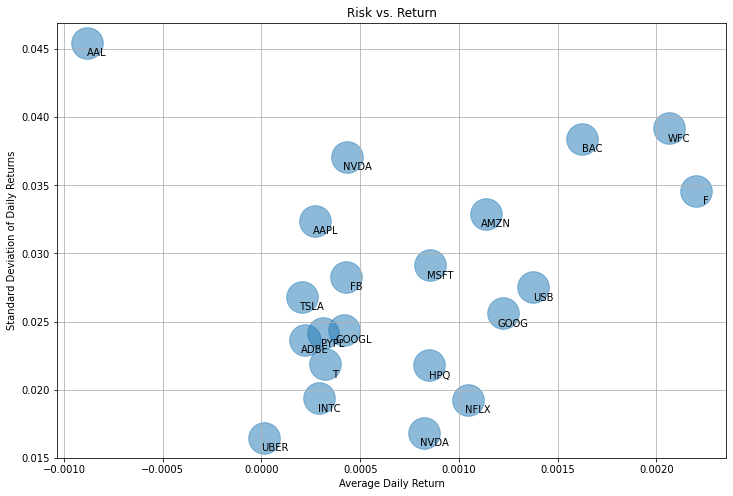

---------------------------------------------------------------------------
IndexError                                Traceback (most recent call last)
<command-4168500306493286> in <cell line: 23>()
     22 # Label each point with the corresponding stock symbol
     23 for i, symbol in enumerate(symbols):
---> 24     plt.annotate(symbol, (avg_daily_returns[i], std_daily_returns[i]), xytext=(10,-10), textcoords='offset points', ha='center', va='center')
     25 
     26 plt.show()

/databricks/python/lib/python3.9/site-packages/pandas/core/series.py in __getitem__(self, key)
    937 
    938         if is_integer(key) and self.index._should_fallback_to_positional():
--> 939             return self._values[key]
    940 
    941         elif key_is_scalar:

IndexError: index 21 is out of bounds for axis 0 with size 21

In [0]:
# Calculate daily returns
all_stocks_data['daily_return'] = all_stocks_data.groupby('symbol')['closing_price'].pct_change()

# Calculate the daily average percentage change in closing price for each stock
avg_daily_returns = all_stocks_data.groupby('symbol')['daily_return'].mean()

# Calculate the standard deviation of the daily percentage change in closing price for each stock
std_daily_returns = all_stocks_data.groupby('symbol')['daily_return'].std()

# Merge the average and standard deviation of returns into a single DataFrame
risk_data = pd.concat([avg_daily_returns, std_daily_returns], axis=1)
risk_data.columns = ['avg_daily_return', 'std_daily_return']


plt.figure(figsize=(12, 8))
plt.scatter(avg_daily_returns, std_daily_returns, s=1000, alpha=0.5)
plt.xlabel('Average Daily Return')
plt.ylabel('Standard Deviation of Daily Returns')
plt.title('Risk vs. Return')
plt.grid(True)

# Label each point with the corresponding stock symbol
for i, symbol in enumerate(symbols):
    plt.annotate(symbol, (avg_daily_returns[i], std_daily_returns[i]), xytext=(10,-10), textcoords='offset points', ha='center', va='center')

plt.show()

In [0]:
### Which stock had the highest opening price on average during the time period?
from pyspark.sql import SparkSession

# Created a SparkSession
spark = SparkSession.builder.appName("StockAnalysis").getOrCreate()

# Read the CSV file into a PySpark DataFrame
all_stocks_data = spark.read.csv("/mnt/data/stocks.csv", header=True, inferSchema=True)

# Filtered the DataFrame to include only the relevant time period
all_stocks_data = all_stocks_data.filter((all_stocks_data.date >= "2000-01-01") & (all_stocks_data.date <= "2023-05-01"))

# Grouped to DataFrame by symbol and calculate the average opening price
avg_opening_price = all_stocks_data.groupBy("symbol").agg({"opening_price": "avg"})

# Show the results
avg_opening_price.show()

+------+------------------+
|symbol|avg(opening_price)|
+------+------------------+
|  AAPL| 16.48675626296252|
|     F|12.459000493654111|
|   WFC| 36.50904728233083|
|  TSLA| 14.23954846782702|
|  INTC|31.997104464133475|
|  GOOG| 49.68928112730263|
|  NFLX| 17.99646843937223|
|   BAC|27.768580516271943|
|  UBER|36.982760639360635|
|   AAL| 32.05694327411171|
|   HPQ|17.190990475379106|
|  PYPL|62.053964897260265|
|  AMZN| 18.42529158040297|
|  MSFT| 35.10187937282976|
|   USB| 35.35665483046502|
|  ADBE| 36.46465606613179|
|  NVDA| 11.97566952362484|
|  META| 54.72037077997678|
|     T|24.299783949565605|
| GOOGL|29.004200559124474|
+------+------------------+
only showing top 20 rows



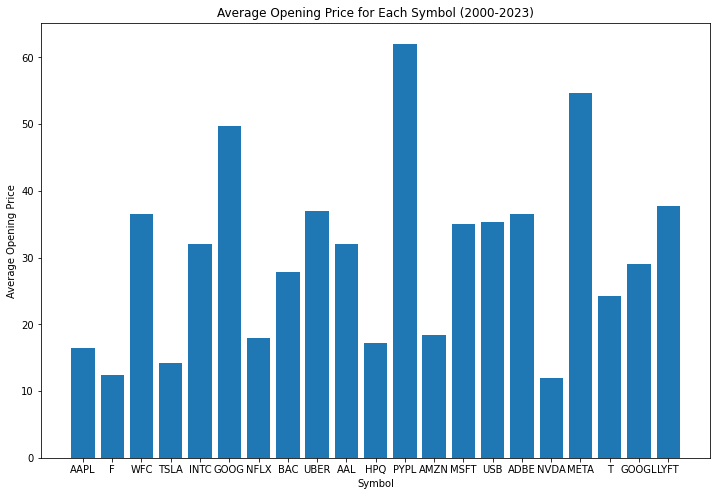

In [0]:
# Converting the PySpark DataFrame to a Pandas DataFrame
pandas_df = avg_opening_price.toPandas()

# Creating a bar chart of the average opening price for each symbol
fig, ax = plt.subplots(figsize=(12, 8)) # Increase the figure size
plt.bar(pandas_df["symbol"], pandas_df["avg(opening_price)"])
plt.xlabel("Symbol")
plt.ylabel("Average Opening Price")
plt.title("Average Opening Price for Each Symbol (2000-2023)")
plt.show()

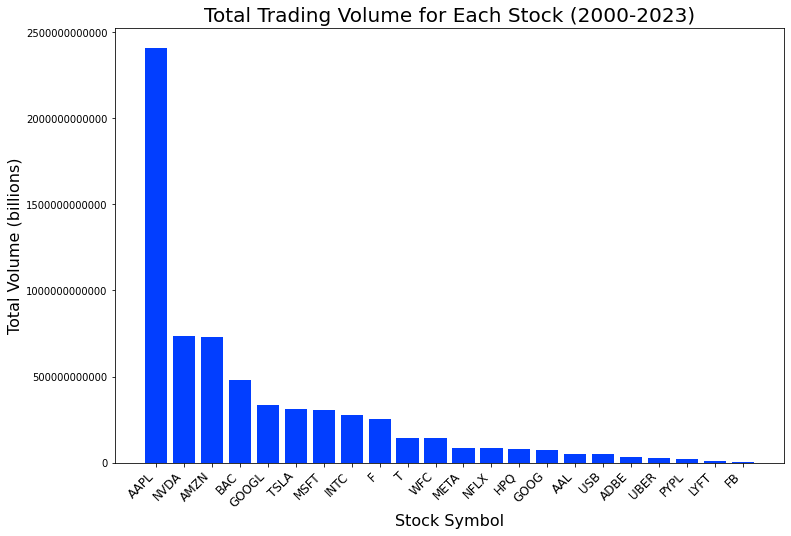

In [0]:
# Setup the Finnhub client with the API key
finnhub_client = finnhub.Client(api_key="cgdk2u9r01qpf4i24vtgcgdk2u9r01qpf4i24vu0")

# defining the stock symbols and time period
symbols = ['AAPL', 'GOOG', 'MSFT', 'AMZN', 'FB', 'TSLA', 'NVDA', 'NFLX', 'PYPL', 'ADBE', 'AAL', 'USB', 'INTC', 'WFC', 'BAC', 'HPQ', 'UBER', 'F', 'NVDA', 'T', 'GOOGL', 'LYFT', 'META' ]
start_date = '2000-01-01'
end_date = '2023-05-01'

# Fetching and transforming the data for all stocks
all_stocks_data = pd.DataFrame()
for symbol in symbols:
    data = finnhub_client.stock_candles(symbol, 'D', int(pd.Timestamp(start_date).timestamp()), int(pd.Timestamp(end_date).timestamp()))
    df = pd.DataFrame(data)
    df['symbol'] = symbol
    df['date'] = pd.to_datetime(df['t'], unit='s')
    df['opening_price'] = df['o'].astype(float)
    df['closing_price'] = df['c'].astype(float)
    df['volume'] = df['v'].astype(float)
    df.drop(columns=['t', 's', 'h', 'l'], inplace=True)
    all_stocks_data = pd.concat([all_stocks_data, df], ignore_index=True)


# Summing up the volume of each stock for all years
stocks_volume = all_stocks_data.groupby('symbol').agg({'volume': 'sum'}).reset_index()
stocks_volume.sort_values(by='volume', ascending=False, inplace=True)


# Plotting the graph with different colors for each stock
sns.set_palette("bright")
plt.figure(figsize=(12,8))
plt.bar(stocks_volume['symbol'], stocks_volume['volume'])
plt.title("Total Trading Volume for Each Stock (2000-2023)", fontsize=20)
plt.xlabel("Stock Symbol", fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.ylabel("Total Volume (billions)", fontsize=16)
plt.ticklabel_format(style='plain', axis='y')
plt.show()

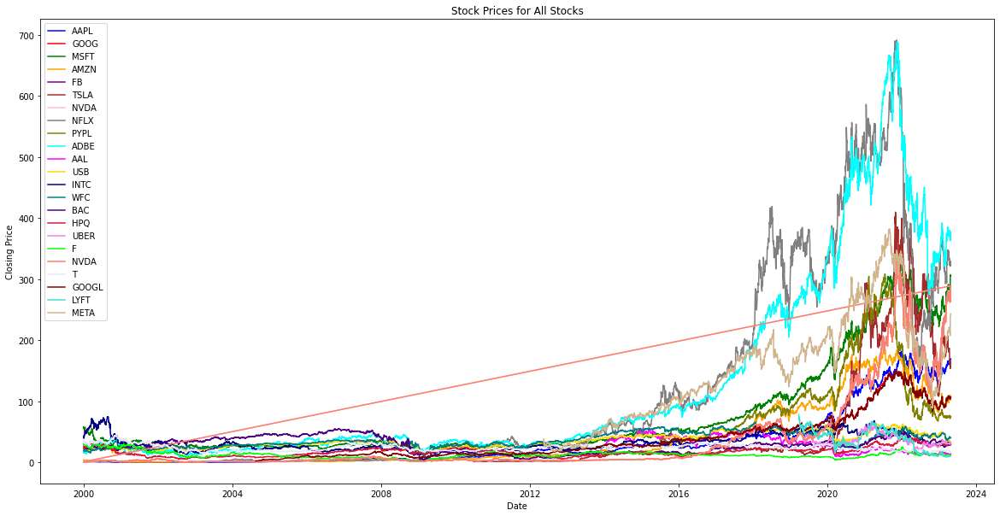

In [0]:
#calculates the total number of stocks traded for each symbol over the entire time period.

colors = ['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan', 'magenta', 'gold', 'navy', 'teal', 'indigo', 'crimson', 'violet', 'lime', 'salmon', 'lavender', 'maroon', 'turquoise', 'tan']

# Grouping the data by date and summing up the volume for each date
daily_volume = all_stocks_data.groupby('date')['volume'].sum()

# Plotting the graph for each stock
plt.figure(figsize=(20,10))
for i, symbol in enumerate(symbols):
    stock = all_stocks_data[all_stocks_data['symbol'] == symbol].reset_index(drop=True)
    plt.plot(stock['date'], stock['closing_price'], color=colors[i % len(colors)], label=symbol)

plt.title('Stock Prices for All Stocks')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.legend(loc='upper left')
plt.show()

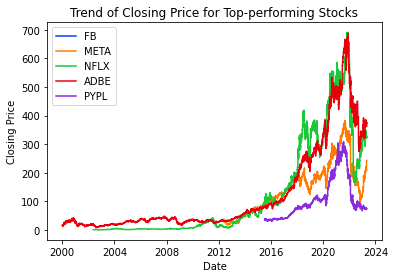

In [0]:
# Group the data by symbol and calculate the average closing price
avg_closing_price = all_stocks_data.groupby('symbol')['closing_price'].mean().reset_index(name='avg_closing_price')

# Sort the data in descending order based on the average closing price
avg_closing_price = avg_closing_price.sort_values(by='avg_closing_price', ascending=False)

# Select the top 5 stocks based on the average closing price
top_stocks = avg_closing_price.head(5)

# Plot the trend of the closing price for each selected stock using a line chart
for symbol in top_stocks['symbol']:
    stock_data = all_stocks_data[all_stocks_data['symbol']==symbol]
    plt.plot(stock_data['date'], stock_data['closing_price'], label=symbol)

plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.title('Trend of Closing Price for Top-performing Stocks')
plt.legend()
plt.show()

   symbol  avg_closing_price
0     AAL          22.500175
1    AAPL         105.190587
2    ADBE         387.455917
3    AMZN         121.521664
4     BAC          32.692526
5       F          11.229778
6      FB         169.612727
7    GOOG          88.873758
8   GOOGL          88.561990
9     HPQ          25.434007
10   INTC          48.701505
11   LYFT          37.706922
12   META         218.316473
13   MSFT         205.047983
14   NFLX         391.025496
15   NVDA         127.484776
16   PYPL         140.028745
17      T          22.252440
18   TSLA         141.786645
19   UBER          36.946913
20    USB          49.603185
21    WFC          43.865735


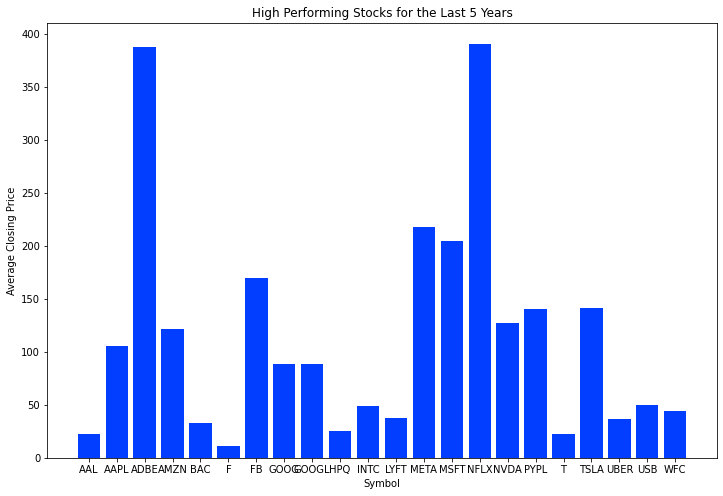

In [0]:
# Define start and end dates for the last 5 years
start_date = '2018-05-01'
end_date = '2023-05-01'

# Filter the data for the last 5 years
last_5_years_data = all_stocks_data[(all_stocks_data['date'] >= pd.to_datetime(start_date)) & (all_stocks_data['date'] <= pd.to_datetime(end_date))]

# Calculate the average closing price for each stock symbol
avg_closing_price = last_5_years_data.groupby('symbol')['closing_price'].mean().reset_index(name='avg_closing_price')

# Calculate the standard deviation of closing price for each stock symbol
std_closing_price = last_5_years_data.groupby('symbol')['closing_price'].std().reset_index(name='std_closing_price')

# Calculate the lower bound for each stock symbol
lower_bound = avg_closing_price['avg_closing_price'] - std_closing_price['std_closing_price']

# Filter out the low performing stocks based on the closing price
high_performing_stocks = avg_closing_price[avg_closing_price['avg_closing_price'] > lower_bound] 
low_performing_stocks = avg_closing_price[avg_closing_price['avg_closing_price'] < lower_bound].sort_values('avg_closing_price').tail(5)

# Print the high performing stocks
print(high_performing_stocks)

# Visualize the high performing stocks
plt.figure(figsize=(12,8))
plt.bar(high_performing_stocks['symbol'], high_performing_stocks['avg_closing_price'])
plt.xlabel("Symbol")
plt.ylabel("Average Closing Price")
plt.title("High Performing Stocks for the Last 5 Years")
plt.show()      